### Imports



In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
from torch.utils.data import random_split
import matplotlib.pyplot as plt

import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

import logging

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


### Data Import & Transform

In [ ]:
'''
REFERENCED FROM https://stackoverflow.com/questions/56582246/correct-data-loading-splitting-and-augmentation-in-pytorch
'''

from torch.utils.data import Dataset

class ApplyTransform(Dataset):
    """
    Apply transformations to a Dataset

    Arguments:
        dataset (Dataset): A Dataset that returns (sample, target)
        transform (callable, optional): A function/transform to be applied on the sample
        target_transform (callable, optional): A function/transform to be applied on the target

    """
    def __init__(self, dataset, transform=None, target_transform=None):
        self.dataset = dataset
        self.transform = transform
        self.target_transform = target_transform

    def __getitem__(self, idx):
        sample, target = self.dataset[idx]
        if self.transform is not None:
            sample = self.transform(sample)
        if self.target_transform is not None:
            target = self.target_transform(target)
        return sample, target

    def __len__(self):
        return len(self.dataset)

In [ ]:
#transform data (add to this later)
transform_train = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Resize([256, 256]),
     transforms.RandomHorizontalFlip(),
     transforms.Grayscale(3),
     transforms.Normalize((0.4714, 0.4786, 0.4490), (0.2153, 0.2040, 0.1967))])

transform_test = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Resize([256, 256]),
     transforms.Normalize((0.4714, 0.4786, 0.4490), (0.2153, 0.2040, 0.1967))])

#import dataset
total_dataset = datasets.ImageFolder('drive/My Drive/UCMerced_LandUse/png_images', transform=None)

#split dataset and load them into train and test - 80/20 split
train_size = int(0.8 * len(total_dataset))
test_size = len(total_dataset) - train_size
train_dataset, test_dataset = random_split(total_dataset, [train_size, test_size])

#apply separate transforms depending on train and test set
train_dataset = ApplyTransform(train_dataset, transform=transform_train)
test_dataset = ApplyTransform(test_dataset, transform=transform_test)

trainloader = DataLoader(dataset=train_dataset, batch_size=4)
testloader = DataLoader(dataset=test_dataset, batch_size=4)

classes = (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)
class_labels = {y: x for x, y in total_dataset.class_to_idx.items()} #built in identifier mapping labels to class number
print(class_labels)

{0: 'agricultural', 1: 'airplane', 2: 'baseballdiamond', 3: 'beach', 4: 'buildings', 5: 'chaparral', 6: 'denseresidential', 7: 'forest', 8: 'freeway', 9: 'golfcourse', 10: 'harbor', 11: 'intersection', 12: 'mediumresidential', 13: 'mobilehomepark', 14: 'overpass', 15: 'parkinglot', 16: 'river', 17: 'runway', 18: 'sparseresidential', 19: 'storagetanks', 20: 'tenniscourt'}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


golfcourse      airplane      chaparral      overpass


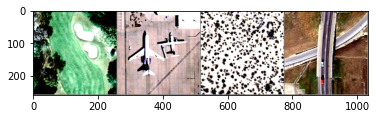

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# functions to show an image

def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))


# get some random training images
dataiter = iter(testloader)
images, labels = dataiter.next()

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print('      '.join('%5s' % class_labels[classes[labels[j]]] for j in range(4)))

### First Model Definition & Initialization

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(4, 4)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.conv3 = nn.Conv2d(16, 32, 5)
        self.fc1 = nn.Linear(32 * 2 * 2, 64)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, 21)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = x.view(-1, 32 * 2 * 2)   

        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

net = Net()

In [ ]:
import torch.optim as optim

criterion = nn.CrossEntropyLoss() #used for classification problems
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

print(device)

net.to(device)


cuda:0


Net(
  (conv1): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (conv3): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=128, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=32, bias=True)
  (fc3): Linear(in_features=32, out_features=21, bias=True)
)

### Second Model Definition & Initialization

In [ ]:
#More computationally expensive to train - testing to see how affects accuracy
class Net_2(nn.Module):
    def __init__(self):
        super(Net_2, self).__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2) #smaller maxpool size to add layers to model (hopefully extracts more features)
        self.pool2 = nn.MaxPool2d(1, 1) #used exclusively for 6th 2d convolutional layer
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.conv3 = nn.Conv2d(16, 32, 5)
        self.conv4 = nn.Conv2d(32, 48, 5)
        self.conv5 = nn.Conv2d(48, 64, 5)
        self.conv6 = nn.Conv2d(64, 70, 3)
        self.fc1 = nn.Linear(70 * 2 * 2, 64)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, 21)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = self.pool(F.relu(self.conv4(x)))
        x = self.pool(F.relu(self.conv5(x)))
        x = self.pool2(F.relu(self.conv6(x)))
        x = x.view(-1, 70 * 2 * 2)   # flatten features

        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

net2 = Net_2()

In [ ]:
criterion = nn.CrossEntropyLoss() #used for classification problems
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

print(device)

net2.to(device)

cuda:0


Net_2(
  (conv1): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (pool2): MaxPool2d(kernel_size=1, stride=1, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (conv3): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1))
  (conv4): Conv2d(32, 48, kernel_size=(5, 5), stride=(1, 1))
  (conv5): Conv2d(48, 64, kernel_size=(5, 5), stride=(1, 1))
  (conv6): Conv2d(64, 70, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=280, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=32, bias=True)
  (fc3): Linear(in_features=32, out_features=21, bias=True)
)

### Training Code

In [ ]:
for epoch in range(30):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        outputs = net2(inputs) #CHANGE MODEL DEPENDING ON WHICH ONE TESTING
        loss = criterion(outputs.to(device), labels.to(device))
        loss.backward()
        optimizer.step()
      
        running_loss += loss.item()
        if i % 140 == 139:    # print every 2000 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 140))
            running_loss = 0.0

print('Finished Training')

### Save and Load Model

In [ ]:
#Save Model for resuming training since results are looking good so far
torch.save({
            'epoch': 40,
            'model_state_dict': net.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss
            }, 'drive/My Drive/UCMerced_LandUse/Saved Models/net_Final_Attempt.pth')


# torch.save(net.state_dict(), 'drive/My Drive/UCMerced_LandUse/Saved Models/net1.pth')

In [ ]:
#Resume training with saved model

checkpoint = torch.load('drive/My Drive/UCMerced_LandUse/Saved Models/net_GrayScale.pth')
net.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
epoch = checkpoint['epoch']
loss = checkpoint['loss']

net.train()

Net(
  (conv1): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (conv3): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=128, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=32, bias=True)
  (fc3): Linear(in_features=32, out_features=21, bias=True)
)

### Inference

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


GroundTruth:  buildings harbor airplane intersection
Predicted:  harbor harbor airplane intersection


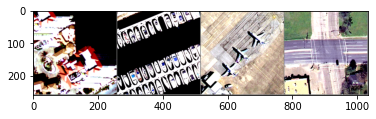

In [ ]:
#Testing accuracy of dataset on random batch of images in test set

dataiter = iter(testloader)
images, labels = dataiter.next()
images, labels = images.to(device), labels.to(device)

# print images
imshow(torchvision.utils.make_grid(images.cpu()))
print('GroundTruth: ', ' '.join('%5s' % class_labels[classes[labels[j]]] for j in range(4)))

# make predictions
outputs = net(images)
_, predicted = torch.max(outputs, 1)

print('Predicted: ', ' '.join('%5s' % class_labels[classes[predicted[j]]]
                              for j in range(4)))

In [ ]:
#Tests accuracy of model on overall test set

def test_accuracy(net, testloader):
    correct = 0
    total = 0
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            outputs = net(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
    return 100. * correct / total

acc = test_accuracy(net, testloader)
print('Accuracy of the network on the test images: %d %%' % (acc))

Accuracy of the network on the test images: 84 %


In [ ]:
#Tests accuracy on all sparseresidential images in test set
import time

def test_sparseresidential_accuracy(net, testloader):
    correct = 0
    total = 0
    start = end = 0
    inference_times = []
    with torch.no_grad():
        for data in testloader:
            start = time.perf_counter()
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            images = images[labels == 18]
            labels = labels[labels == 18]
            if len(labels) > 0 and len(images) > 0:
              outputs = net(images)
              _, predicted = torch.max(outputs.data, 1)
              total += labels.size(0)
              correct += (predicted == labels).sum().item()
              end = time.perf_counter()
              inference_times.append(end - start)

    average_inf_time = np.mean(inference_times)
    print('Average time taken to run inference: %f seconds' % (average_inf_time))

    return 100. * correct / total

sparseres_acc = test_sparseresidential_accuracy(net, testloader)
print('Accuracy of the network on the sparseresidential test images: %d %%' % (sparseres_acc))

Average time taken to run inference: 0.002130 seconds
Accuracy of the network on the sparseresidential test images: 80 %


Accuracy of the network on the MassGis Aerial Imagery validation images: 12 %


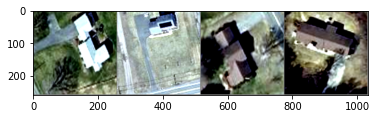

In [ ]:
#Tests accuracy on inference images collected from MassGIS Aerial Imagery Dataset

def test_validation_accuracy(net, testloader):
    correct = 0
    total = 0
    with torch.no_grad():
            for data in valloader:
                images, labels = data
                images, labels = images.to(device), labels.to(device)
                outputs = net(images)
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += predicted[predicted == 18].size(0) #check if prediction is sparseresidential label

    return 100. * correct / total


#load inference dataset
val_dataset = datasets.ImageFolder('drive/My Drive/UCMerced_LandUse/inference_images', transform=None)
val_dataset = ApplyTransform(val_dataset, transform=transform_test) #apply same transform applied to test set
valloader = DataLoader(dataset=val_dataset, batch_size=4)

# get some random validation images
val_dataiter = iter(valloader)
val_images, val_labels = val_dataiter.next()

logger = logging.getLogger() #get rid of rgb values being clipped log
old_level = logger.level
logger.setLevel(100)

# show images
imshow(torchvision.utils.make_grid(val_images))

logger.setLevel(old_level) #set logger back to default


inference_acc = test_validation_accuracy(net, valloader)
print('Accuracy of the network on the MassGis Aerial Imagery validation images: %d %%' % (inference_acc))

### [**Tensorboard Utilization**]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


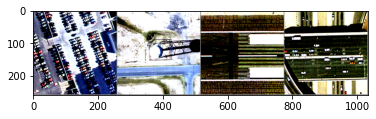

In [ ]:
'''
Running tensorboard code to conduct hyperparameter search: https://pytorch.org/tutorials/intermediate/tensorboard_tutorial.html
'''
from torch.utils.tensorboard import SummaryWriter

# default `log_dir` is "runs" - we'll be more specific here
writer = SummaryWriter('drive/My Drive/UCMerced_LandUse/runs/senior_design_experiment_2')

dataiter = iter(testloader)
images, labels = dataiter.next()

img_grid = torchvision.utils.make_grid(images)
# show images
imshow(img_grid)

# write to tensorboard
writer.add_image('four_UCMerced_test_images', img_grid)

In [ ]:
# helper functions - from https://pytorch.org/tutorials/intermediate/tensorboard_tutorial.html

import warnings
warnings.filterwarnings("ignore")

# helper function to show an image
# (used in the `plot_classes_preds` function below)
def matplotlib_imshow(img, one_channel=False):
    logger = logging.getLogger() #get rid of rgb values being clipped log
    old_level = logger.level
    logger.setLevel(100)

    if one_channel:
        img = img.mean(dim=0)
    img = img / 2 + 0.5     # unnormalize
    npimg = img.cpu().numpy()
    if one_channel:
        plt.imshow(npimg, cmap="Greys")
    else:
        plt.imshow(np.transpose(npimg, (1, 2, 0)))

    logger.setLevel(old_level) #set logger back to default



def images_to_probs(net, images):
    '''
    Generates predictions and corresponding probabilities from a trained
    network and a list of images
    '''
    output = net(images)
    # convert output probabilities to predicted class
    _, preds_tensor = torch.max(output, 1)
    preds = np.squeeze(preds_tensor.cpu().numpy())
    return preds, [F.softmax(el, dim=0)[i].item() for i, el in zip(preds, output)]


def plot_classes_preds(net, images, labels):
    '''
    Generates matplotlib Figure using a trained network, along with images
    and labels from a batch, that shows the network's top prediction along
    with its probability, alongside the actual label, coloring this
    information based on whether the prediction was correct or not.
    Uses the "images_to_probs" function.
    '''
    preds, probs = images_to_probs(net, images)
    # plot the images in the batch, along with predicted and true labels
    fig = plt.figure(figsize=(12, 48))
    for idx in np.arange(4):
        ax = fig.add_subplot(1, 4, idx+1, xticks=[], yticks=[])
        matplotlib_imshow(images[idx], one_channel=False)
        ax.set_title("{0}, {1:.1f}%\n(label: {2})".format(
            class_labels[classes[preds[idx]]],
            probs[idx] * 100.0,
            class_labels[classes[labels[idx]]]),
                    color=("green" if preds[idx]==labels[idx].item() else "red"))
    return fig

In [ ]:
running_loss = 0.0
for epoch in range(10):  # loop over the dataset multiple times

    for i, data in enumerate(trainloader, 0):

        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs.to(device), labels.to(device))
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        if i % 140 == 139:    # every 10 mini-batches...

            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 140))

            # ...log the running loss
            writer.add_scalar('training loss',
                            running_loss / 140,
                            epoch * len(trainloader) + i)

            # ...log a Matplotlib Figure showing the model's predictions on a
            # random mini-batch
            writer.add_figure('predictions vs. actuals',
                            plot_classes_preds(net, inputs, labels),
                            global_step=epoch * len(trainloader) + i)
            running_loss = 0.0
print('Finished Training')

[1,   140] loss: 0.753
[1,   280] loss: 0.625
[1,   420] loss: 0.527
[2,   140] loss: 0.484
[2,   280] loss: 0.458
[2,   420] loss: 0.450
[3,   140] loss: 0.341
[3,   280] loss: 0.417
[3,   420] loss: 0.512
[4,   140] loss: 0.414
[4,   280] loss: 0.375
[4,   420] loss: 0.376
[5,   140] loss: 0.320
[5,   280] loss: 0.486
[5,   420] loss: 0.448
[6,   140] loss: 0.482
[6,   280] loss: 0.527
[6,   420] loss: 0.466
[7,   140] loss: 0.503
[7,   280] loss: 0.362
[7,   420] loss: 0.361
[8,   140] loss: 0.440
[8,   280] loss: 0.374
[8,   420] loss: 0.461
[9,   140] loss: 0.245
[9,   280] loss: 0.469
[9,   420] loss: 0.419
[10,   140] loss: 0.316
[10,   280] loss: 0.464
[10,   420] loss: 0.361
Finished Training


In [ ]:
%load_ext tensorboard
%tensorboard --logdir=drive/MyDrive/UCMerced_LandUse/runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 881), started 0:44:36 ago. (Use '!kill 881' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
%reload_ext tensorboard

### Utils

In [ ]:
#Testing the image sizes of the data
from PIL import Image
import os
import cv2

path = 'drive/My Drive/UCMerced_LandUse/png_images/'
for folder in os.listdir(path):
  folder_path = os.path.join(path, folder)
  for img in os.listdir(folder_path):
    im = cv2.imread(os.path.join(folder_path, img))
    if im.shape != (256, 256, 3):
      print(im)
      print(im.shape)

#More testing - seeing how transform affects the data
count = 0
for i, data in enumerate(trainloader, 0):
    # get the inputs
    inputs, labels = data
    inputs, labels = inputs.to(device), labels.to(device)
    print(inputs.shape)
    print(labels.shape)
    count += 1
print(count)


In [ ]:
#Testing - Get mean and standard deviation of images for normalization
count = 0
total_mean = torch.zeros(3)
total_std = torch.zeros(3)
for i, data in enumerate(trainloader, 0):
  images, labels = data
  for j in range(0,3):
    # calculate mean and std
    # mean, std = torch.std_mean(images[j])
    curr_mean, curr_std = images[j].mean([1,2]), images[j].std([1,2])
    count += 1
    total_mean += curr_mean
    total_std += curr_std

mean = total_mean / count
std = total_std / count
# print mean and std
print("mean and std before normalize:")
print("Mean of the image:", mean)
print("Std of the image:", std)
  

mean and std before normalize:
Mean of the image: tensor([0.4714, 0.4786, 0.4490])
Std of the image: tensor([0.2153, 0.2040, 0.1967])
